In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from PIL import Image

from tqdm import tqdm


2024-12-15 18:54:46.659094: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-15 18:54:46.708968: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-15 18:54:46.710161: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-15 18:54:47.715323: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [ ]:
!pip install wordcloud


In [ ]:
import glob
import collections
import wordcloud
from wordcloud import WordCloud, STOPWORDS


playsound is relying on another python subprocess. Please use `pip install pygobject` if you want playsound to run more efficiently.


In [6]:
images='/home/ubuntu/praneeth_nlp/decafes/1/Images'

all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 8091


/tmp/ipykernel_5012/1467222229.py:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  ax.imshow(imageio.imread(image), cmap=None)


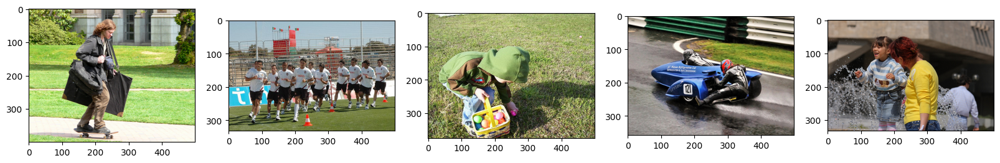

In [7]:
import imageio

Display_Images = all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)

for ax, image in zip(axes, Display_Images):
  ax.imshow(imageio.imread(image), cmap=None)


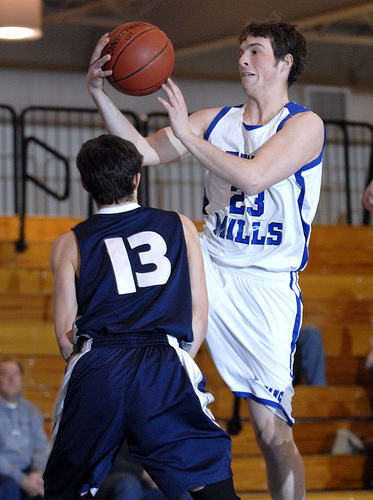

In [8]:
import random
Image.open(all_imgs[random.randrange(40, 60, 3)])

In [9]:
text_file = '/home/ubuntu/praneeth_nlp/decafes/1/captions.txt'

def load_doc(filename):
    
    #your code here
    open_file = open(text_file, 'r', encoding='latin-1' )
    text = open_file.read() 
    open_file.close()
    
    return text

doc = load_doc(text_file)
print(doc[:300])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing


In [10]:
img_path = '/home/ubuntu/praneeth_nlp/decafes/1/Images/'

all_img_id = [] 
all_img_vector = [] 
annotations = [] 

with open('/home/ubuntu/praneeth_nlp/decafes/1/captions.txt' , 'r') as fo:
  next(fo) 
  for line in fo :
    split_arr = line.split(',')
    all_img_id.append(split_arr[0])
    annotations.append(split_arr[1].rstrip('\n.')) 
    all_img_vector.append(img_path+split_arr[0])

df = pd.DataFrame(list(zip(all_img_id, all_img_vector,annotations)),columns =['ID','Path', 'Captions']) 
    
df

,ID,Path,Captions
0,1000268201_693b08cb0e.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/100...,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/100...,A girl going into a wooden building
2,1000268201_693b08cb0e.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/100...,A little girl climbing into a wooden playhouse
3,1000268201_693b08cb0e.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/100...,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/100...,A little girl in a pink dress going into a woo...
...,...,...,...
40450,997722733_0cb5439472.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/997...,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/997...,A man is rock climbing high in the air
40452,997722733_0cb5439472.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/997...,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,/home/ubuntu/praneeth_nlp/decafes/1/Images/997...,A rock climber in a red shirt


In [11]:
len (annotations)

40455

In [12]:
type (annotations)

list

In [13]:
print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_imgs)))

Total captions present in the dataset: 40455
Total images present in the dataset: 8091


In [14]:
vocabulary = [word.lower() for line in annotations for word in line.split()]

val_count = Counter(vocabulary) 
val_count

Counter({'a': 60196,
         'in': 18174,
         'the': 17507,
         'on': 10357,
         'is': 9069,
         'and': 8057,
         'dog': 7948,
         'with': 7304,
         'man': 7137,
         'of': 6495,
         'two': 5132,
         'white': 3706,
         'black': 3620,
         'boy': 3514,
         'are': 3365,
         'woman': 3304,
         'girl': 3277,
         'to': 3005,
         'wearing': 2916,
         'people': 2811,
         'at': 2810,
         'water': 2676,
         'young': 2587,
         'red': 2553,
         'brown': 2457,
         'an': 2325,
         'his': 2255,
         'blue': 2125,
         'dogs': 2095,
         'running': 1996,
         'through': 1978,
         'playing': 1954,
         'while': 1807,
         'down': 1755,
         'little': 1736,
         'shirt': 1735,
         'standing': 1702,
         'ball': 1678,
         'grass': 1565,
         'person': 1515,
         'child': 1507,
         'snow': 1439,
         'jumping': 1430

a :  60196
in :  18174
the :  17507
on :  10357
is :  9069
and :  8057
dog :  7948
with :  7304
man :  7137
of :  6495
two :  5132
white :  3706
black :  3620
boy :  3514
are :  3365
woman :  3304
girl :  3277
to :  3005
wearing :  2916
people :  2811
at :  2810
water :  2676
young :  2587
red :  2553
brown :  2457
an :  2325
his :  2255
blue :  2125
dogs :  2095
running :  1996


Text(0, 0.5, 'Count')

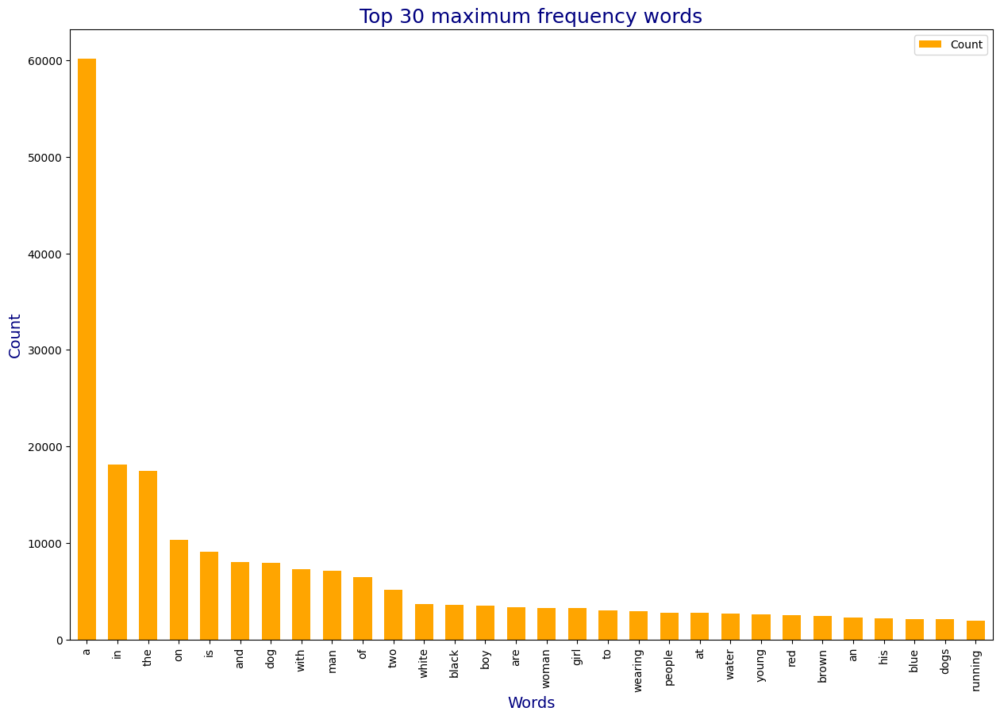

In [15]:
for word, count in val_count.most_common(30):
  print(word, ": ", count)

lst = val_count.most_common(30)
most_common_words_df = pd.DataFrame(lst, columns = ['Word', 'Count'])
most_common_words_df.plot.bar(x='Word', y='Count', width=0.6, color='orange', figsize=(15, 10))
plt.title("Top 30 maximum frequency words", fontsize = 18, color= 'navy')
plt.xlabel("Words", fontsize = 14, color= 'navy')
plt.ylabel("Count", fontsize = 14, color= 'navy')


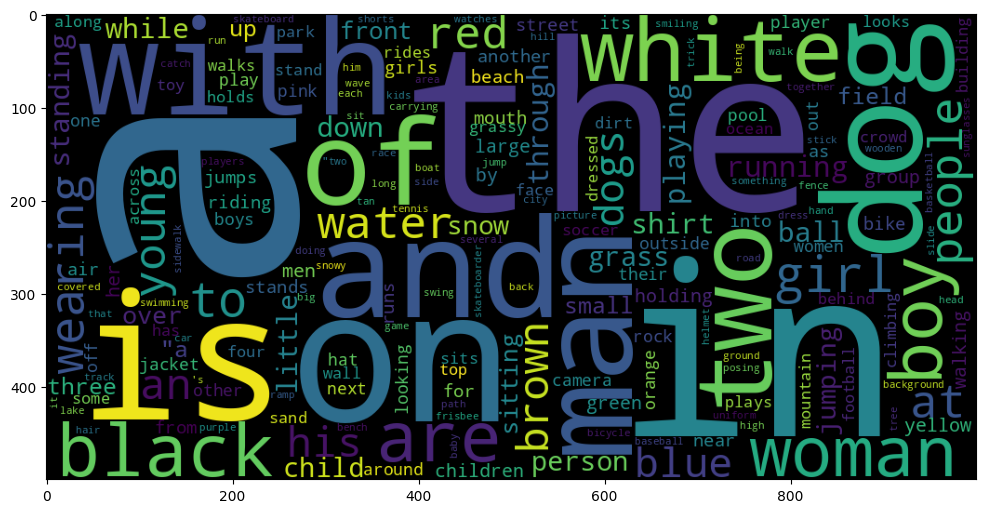

In [16]:
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(val_count)
plt.figure(figsize = (12, 12))
plt.imshow(wordcloud)

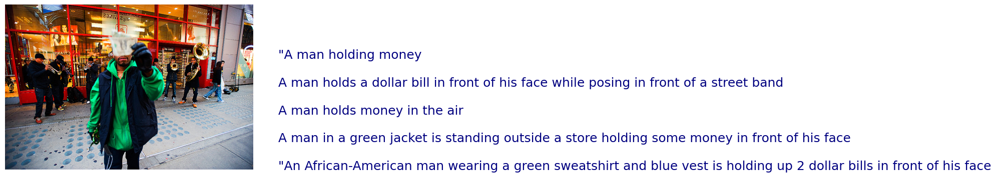

In [17]:
def caption_with_img_plot(image_id, frame) :
  capt = ("\n" *2).join(frame[frame['ID'] == image_id].Captions.to_list())
  fig, ax = plt.subplots()
  ax.set_axis_off()
  idx = df.ID.to_list().index(image_id)
  im =  Image.open(df.Path.iloc[idx])
  w, h = im.size[0], im.size[-1]
  ax.imshow(im)
  ax.text(w+50, h, capt, fontsize = 18, color = 'navy')
caption_with_img_plot(df.ID.iloc[8049], df)

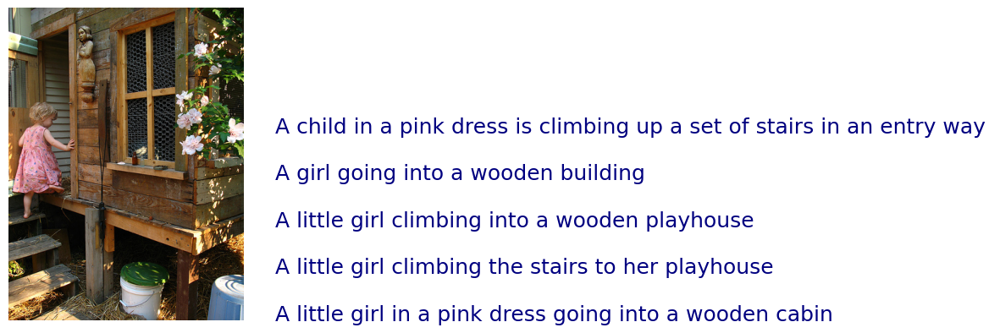

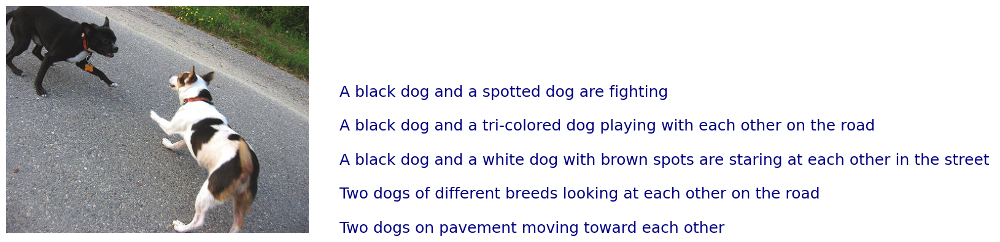

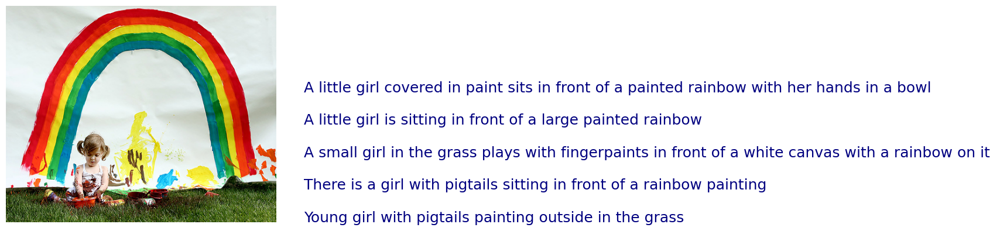

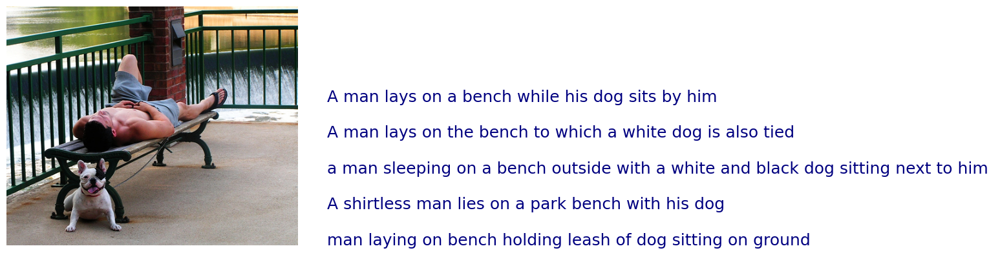

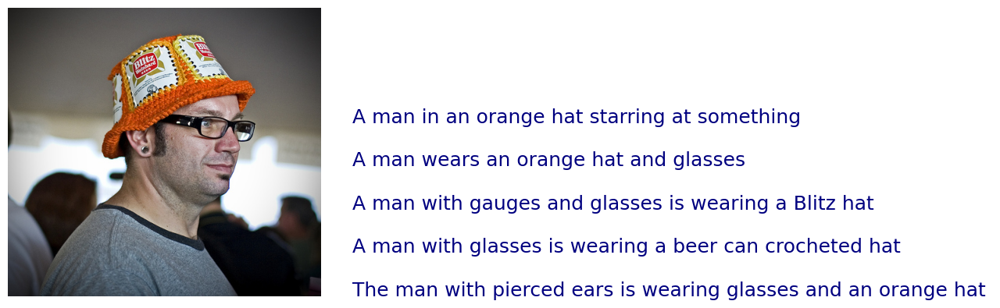

In [18]:
def execute_img_capt(start, end, frame) :
  for r in range(start, end) :
    caption_with_img_plot(frame.ID.drop_duplicates().iloc[r], frame)

execute_img_capt(0, 5, df)  

In [19]:
rem_punct = str.maketrans('', '', string.punctuation)
for r in range(len(annotations)) :
  line = annotations[r]
  line = line.split()

  line = [word.lower() for word in line]

  line = [word.translate(rem_punct) for word in line]
  line = [word for word in line if len(word) > 1]

  line = [word for word in line if word.isalpha()]

  annotations[r] = ' '.join(line)


In [20]:
annotations = ['<start>' + ' ' + line + ' ' + '<end>' for line in annotations]

all_img_path = all_img_vector

In [21]:
annotations[0:5]

['<start> child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start> girl going into wooden building <end>',
 '<start> little girl climbing into wooden playhouse <end>',
 '<start> little girl climbing the stairs to her playhouse <end>',
 '<start> little girl in pink dress going into wooden cabin <end>']

In [22]:
top_word_cnt = 5000
tokenizer = Tokenizer(num_words = top_word_cnt+1, filters= '!"#$%^&*()_+.,:;-?/~`{}[]|\=@ ',
                      lower = True, char_level = False, 
                      oov_token = 'UNK')

In [23]:
tokenizer.fit_on_texts(annotations)

train_seqs = tokenizer.texts_to_sequences(annotations)

In [24]:
tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [ ]:
#import pickle

# Save the tokenizer as a pickle file
#with open('tokenizer.pkl', 'wb') as file:
#    pickle.dump(tokenizer, file)


In [25]:
print(tokenizer.oov_token)
print(tokenizer.index_word[0])

UNK
PAD


#### View index words

In [26]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'little',
 38: 'shirt',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'three',
 48: 'front',
 49: 'sitting',
 50: 'small',
 51: 'field',
 52: 'up',
 53: 'holding',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'children',
 60: 'walking',
 61: 'men',
 62: 'her',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: 'it

In [27]:
tokenizer_top_words = [word for line in annotations for word in line.split() ]

tokenizer_top_words_count = collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

Counter({'<start>': 40455,
         '<end>': 40455,
         'in': 18182,
         'the': 17676,
         'on': 10367,
         'is': 9069,
         'and': 8057,
         'dog': 7956,
         'with': 7308,
         'man': 7164,
         'of': 6496,
         'two': 5546,
         'white': 3710,
         'black': 3627,
         'boy': 3534,
         'are': 3365,
         'woman': 3320,
         'girl': 3284,
         'to': 3005,
         'wearing': 2917,
         'people': 2837,
         'at': 2819,
         'water': 2676,
         'young': 2610,
         'red': 2553,
         'brown': 2471,
         'an': 2358,
         'his': 2255,
         'blue': 2125,
         'dogs': 2097,
         'running': 1996,
         'through': 1979,
         'playing': 1954,
         'while': 1818,
         'down': 1755,
         'little': 1750,
         'shirt': 1735,
         'standing': 1703,
         'ball': 1678,
         'grass': 1565,
         'person': 1521,
         'child': 1517,
         'snow':

<start> :  40455
<end> :  40455
in :  18182
the :  17676
on :  10367
is :  9069
and :  8057
dog :  7956
with :  7308
man :  7164
of :  6496
two :  5546
white :  3710
black :  3627
boy :  3534
are :  3365
woman :  3320
girl :  3284
to :  3005
wearing :  2917
people :  2837
at :  2819
water :  2676
young :  2610
red :  2553
brown :  2471
an :  2358
his :  2255
blue :  2125
dogs :  2097


ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

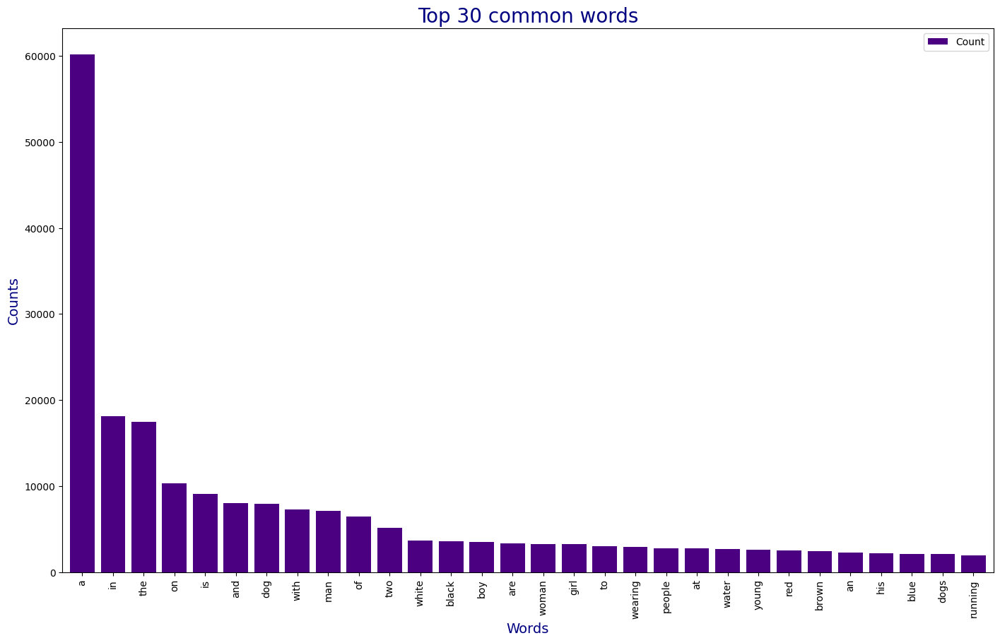

In [28]:
for word, count in tokenizer_top_words_count.most_common(30) :
  print(word, ": ", count)

tokens = tokenizer_top_words_count.most_common(30)
most_com_words_df = pd.DataFrame(tokens, columns = ['Word', 'Count'])

most_common_words_df.plot.bar(x = 'Word', y= 'Count', width=0.8, color = 'indigo', figsize = (17, 10))
plt.title('Top 30 common words', fontsize =20, color= 'navy')
plt.xlabel('Words', fontsize =14, color= 'navy')
plt.ylabel('Counts', fontsize =14, color= 'navy')
plt.grid(b=None)

### Let's view the frequency of words now, post Captions preprocessing

ValueError: keyword grid_b is not recognized; valid keywords are ['size', 'width', 'color', 'tickdir', 'pad', 'labelsize', 'labelcolor', 'labelfontfamily', 'zorder', 'gridOn', 'tick1On', 'tick2On', 'label1On', 'label2On', 'length', 'direction', 'left', 'bottom', 'right', 'top', 'labelleft', 'labelbottom', 'labelright', 'labeltop', 'labelrotation', 'grid_agg_filter', 'grid_alpha', 'grid_animated', 'grid_antialiased', 'grid_clip_box', 'grid_clip_on', 'grid_clip_path', 'grid_color', 'grid_dash_capstyle', 'grid_dash_joinstyle', 'grid_dashes', 'grid_data', 'grid_drawstyle', 'grid_figure', 'grid_fillstyle', 'grid_gapcolor', 'grid_gid', 'grid_in_layout', 'grid_label', 'grid_linestyle', 'grid_linewidth', 'grid_marker', 'grid_markeredgecolor', 'grid_markeredgewidth', 'grid_markerfacecolor', 'grid_markerfacecoloralt', 'grid_markersize', 'grid_markevery', 'grid_mouseover', 'grid_path_effects', 'grid_picker', 'grid_pickradius', 'grid_rasterized', 'grid_sketch_params', 'grid_snap', 'grid_solid_capstyle', 'grid_solid_joinstyle', 'grid_transform', 'grid_url', 'grid_visible', 'grid_xdata', 'grid_ydata', 'grid_zorder', 'grid_aa', 'grid_c', 'grid_ds', 'grid_ls', 'grid_lw', 'grid_mec', 'grid_mew', 'grid_mfc', 'grid_mfcalt', 'grid_ms']

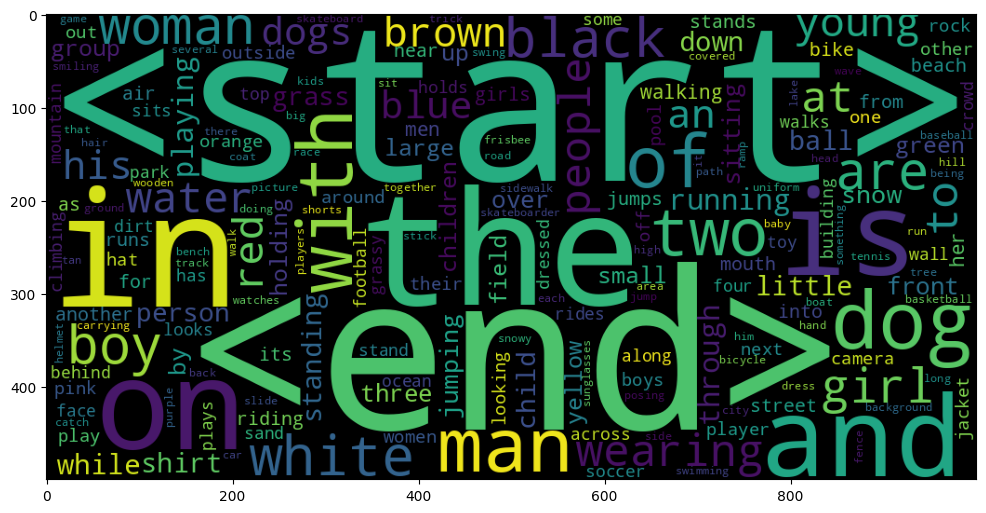

In [29]:
wordcloud_token = WordCloud(width = 1000, height = 500).generate_from_frequencies(tokenizer_top_words_count)
plt.figure(figsize = (12, 8))
plt.imshow(wordcloud_token)
plt.grid(b = None)

In [30]:
train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)

print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(40455, 31)


In [31]:
preprocessed_image = []
IMAGE_SHAPE = (299, 299)

In [32]:
tf.keras.backend.image_data_format()


'channels_last'

In [33]:
for img in all_imgs[0:5] :
    img = tf.io.read_file(img, name=None)

    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)

    preprocessed_image.append(img)


2024-12-15 18:55:24.953383: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-15 18:55:25.526336: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9962033].


Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)
Shape after resize :  (299, 299, 3)


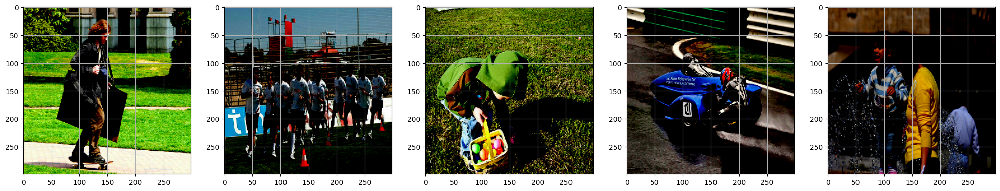

In [34]:
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)

for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')


In [35]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

In [36]:
all_img_vector

['/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1002674143_1b742ab4b8.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1002674143_1b742ab4b8.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/1002674143_1b742ab4b8.jpg',
 '/home/ubuntu/praneeth_nlp/decafes/1/Images/100267

In [37]:
training_list = sorted(set(all_img_vector))

New_Img = tf.data.Dataset.from_tensor_slices(training_list)

New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)

New_Img = New_Img.batch(64, drop_remainder=False)

In [38]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [39]:
path_train, path_test, caption_train, caption_test = train_test_split(all_img_vector, cap_vector, test_size = 0.2, random_state = 42)

In [40]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32364
Testing data for images: 8091
Training data for Captions: 32364
Testing data for Captions: 8091


In [41]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input 
hidden_layer = image_model.layers[-1].output  

image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

In [42]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalization[0][0

In [43]:
img_features = {}
for image, image_path in tqdm(New_Img) :

  batch_features = image_features_extract_model(image)
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 127/127 [07:26<00:00,  3.52s/it]


In [44]:
batch_features

<tf.Tensor: shape=(27, 8, 8, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 7.74662197e-02, 0.00000000e+00, ...,
          2.31837645e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.07787728e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 1.94033504e-01, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 1.85754776e-01],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          9.42662954e-02, 0.00000000e+00, 5.05790830e-01],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 4.23005670e-01, 1.34464502e-02, ...,
          2.33669966e-01, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         

In [45]:
batch_features_flattened

<tf.Tensor: shape=(27, 64, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 7.7466220e-02, 0.0000000e+00, ...,
         2.3183765e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.0778773e-01, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.9403350e-01, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 1.8575478e-01],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 1.6569382e+00, 0.0000000e+00],
        [0.0000000e+00, 4.0261045e-01, 0.0000000e+00, ...,
         0.0000000e+00, 3.1791970e-01, 0.0000000e+00],
        [0.0000000e+00, 2.5347557e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         1.2506015e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 7.8496963e-02, ...,
         1.2064192e+00, 0.0000000e+00, 0.0000000e+00],
        [0.000000

In [46]:
len(img_features)

8091

In [47]:
batch_feat.shape

TensorShape([64, 2048])

In [48]:
import more_itertools
top_5 = more_itertools.take(5, img_features.items())

top_5

[('/home/ubuntu/praneeth_nlp/decafes/1/Images/1000268201_693b08cb0e.jpg',
  array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.16987033],
         [0.        , 0.        , 1.0105923 , ..., 0.        , 0.        ,
          0.06111681],
         ...,
         [0.        , 0.        , 2.038045  , ..., 1.2029712 , 0.        ,
          1.992414  ],
         [0.        , 0.        , 0.9046917 , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 1.2527282 , 0.        , ..., 0.        , 0.        ,
          0.        ]], dtype=float32)),
 ('/home/ubuntu/praneeth_nlp/decafes/1/Images/1001773457_577c3a7d70.jpg',
  array([[0.        , 0.6636802 , 0.46286002, ..., 0.        , 0.        ,
          3.3322637 ],
         [0.        , 1.226817  , 0.        , ..., 0.        , 0.25390273,
          3.3295367 ],
         [1.2881975 , 1.5195404 , 0.

In [49]:
def map(image_name, caption):
    
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [50]:
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):
    
    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)
    
     
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))

    return data

In [51]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [52]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  
print(sample_cap_batch.shape) 

(64, 64, 2048)
(64, 31)


In [53]:
embedding_dim = 256 
units = 512

vocab_size = 5001
train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE  

max_length = 31
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [54]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

PyGraph<130475107190960>


In [55]:
class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) 
        
    def call(self, features):
        features =  self.dense(features) 
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [56]:
encoder=Encoder(embedding_dim)

In [58]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) 
        self.W2 = tf.keras.layers.Dense(units) 
        self.V = tf.keras.layers.Dense(1) 
        self.units=units

    def call(self, features, hidden):

        hidden_with_time_axis = hidden[:, tf.newaxis]

        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))  

        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 

        context_vector = attention_weights * features 

        context_vector = tf.reduce_sum(context_vector, axis=1)  
        
        return context_vector, attention_weights

In [59]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units) 
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) 
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) 
        self.d2 = tf.keras.layers.Dense(vocab_size) 
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) 
        embed = self.embed(x) 
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) 
        output,state = self.gru(embed) 
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) 
        output = self.d2(output) 
        
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [60]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [61]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) 
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) 
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) 

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


In [62]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE) 

In [63]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    
    return tf.reduce_mean(loss_)

In [64]:
checkpoint_path = "model_weights/checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [65]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [66]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        encoder_op = encoder(img_tensor)

        for r in range(1, target.shape[1]) :
        
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions) 
          dec_input = tf.expand_dims(target[:, r], 1)  

    avg_loss = (loss/ int(target.shape[1])) 
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 

    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [67]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    
    hidden = decoder.init_state(batch_size = target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)

      for r in range(1, target.shape[1]) :

        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)

        dec_input = tf.expand_dims(target[: , r], 1)

    avg_loss = (loss/ int(target.shape[1])) 
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 

    optimizer.apply_gradients(zip(grad, trainable_vars))                      


    return loss, avg_loss

In [68]:
def test_loss_cal(test_dataset):
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [69]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  7%|▋         | 1/15 [09:55<2:18:58, 595.60s/it]

For epoch: 1, the train loss is 1.446, & test loss is 1.206
Time taken for 1 epoch 595.453204870224 sec

Test loss has been reduced from 100.000 to 1.206


 13%|█▎        | 2/15 [18:46<2:00:46, 557.44s/it]

For epoch: 2, the train loss is 1.112, & test loss is 1.059
Time taken for 1 epoch 530.6237888336182 sec

Test loss has been reduced from 1.206 to 1.059


 20%|██        | 3/15 [27:36<1:48:59, 544.92s/it]

For epoch: 3, the train loss is 1.006, & test loss is 0.972
Time taken for 1 epoch 529.9267258644104 sec

Test loss has been reduced from 1.059 to 0.972


 27%|██▋       | 4/15 [36:26<1:38:50, 539.18s/it]

For epoch: 4, the train loss is 0.933, & test loss is 0.906
Time taken for 1 epoch 530.2775535583496 sec

Test loss has been reduced from 0.972 to 0.906


 33%|███▎      | 5/15 [45:10<1:28:57, 533.78s/it]

For epoch: 5, the train loss is 0.874, & test loss is 0.848
Time taken for 1 epoch 524.0887675285339 sec

Test loss has been reduced from 0.906 to 0.848


 40%|████      | 6/15 [53:53<1:19:30, 530.03s/it]

For epoch: 6, the train loss is 0.821, & test loss is 0.798
Time taken for 1 epoch 522.6491839885712 sec

Test loss has been reduced from 0.848 to 0.798


 47%|████▋     | 7/15 [1:02:36<1:10:20, 527.58s/it]

For epoch: 7, the train loss is 0.772, & test loss is 0.751
Time taken for 1 epoch 522.4105672836304 sec

Test loss has been reduced from 0.798 to 0.751


 53%|█████▎    | 8/15 [1:11:18<1:01:20, 525.74s/it]

For epoch: 8, the train loss is 0.729, & test loss is 0.714
Time taken for 1 epoch 521.684488773346 sec

Test loss has been reduced from 0.751 to 0.714


 60%|██████    | 9/15 [1:20:00<52:28, 524.70s/it]  

For epoch: 9, the train loss is 0.690, & test loss is 0.670
Time taken for 1 epoch 522.2925879955292 sec

Test loss has been reduced from 0.714 to 0.670


 67%|██████▋   | 10/15 [1:28:42<43:40, 524.03s/it]

For epoch: 10, the train loss is 0.649, & test loss is 0.630
Time taken for 1 epoch 522.4134585857391 sec

Test loss has been reduced from 0.670 to 0.630


 73%|███████▎  | 11/15 [1:37:24<34:53, 523.31s/it]

For epoch: 11, the train loss is 0.615, & test loss is 0.595
Time taken for 1 epoch 521.5574789047241 sec

Test loss has been reduced from 0.630 to 0.595


 80%|████████  | 12/15 [1:46:01<26:03, 521.27s/it]

For epoch: 12, the train loss is 0.583, & test loss is 0.565
Time taken for 1 epoch 516.461216211319 sec

Test loss has been reduced from 0.595 to 0.565


 87%|████████▋ | 13/15 [1:54:40<17:21, 520.66s/it]

For epoch: 13, the train loss is 0.553, & test loss is 0.534
Time taken for 1 epoch 519.1589965820312 sec

Test loss has been reduced from 0.565 to 0.534


 93%|█████████▎| 14/15 [2:03:19<08:40, 520.24s/it]

For epoch: 14, the train loss is 0.526, & test loss is 0.508
Time taken for 1 epoch 519.1493020057678 sec

Test loss has been reduced from 0.534 to 0.508


100%|██████████| 15/15 [2:11:59<00:00, 527.93s/it]

For epoch: 15, the train loss is 0.500, & test loss is 0.483
Time taken for 1 epoch 519.0782475471497 sec

Test loss has been reduced from 0.508 to 0.483


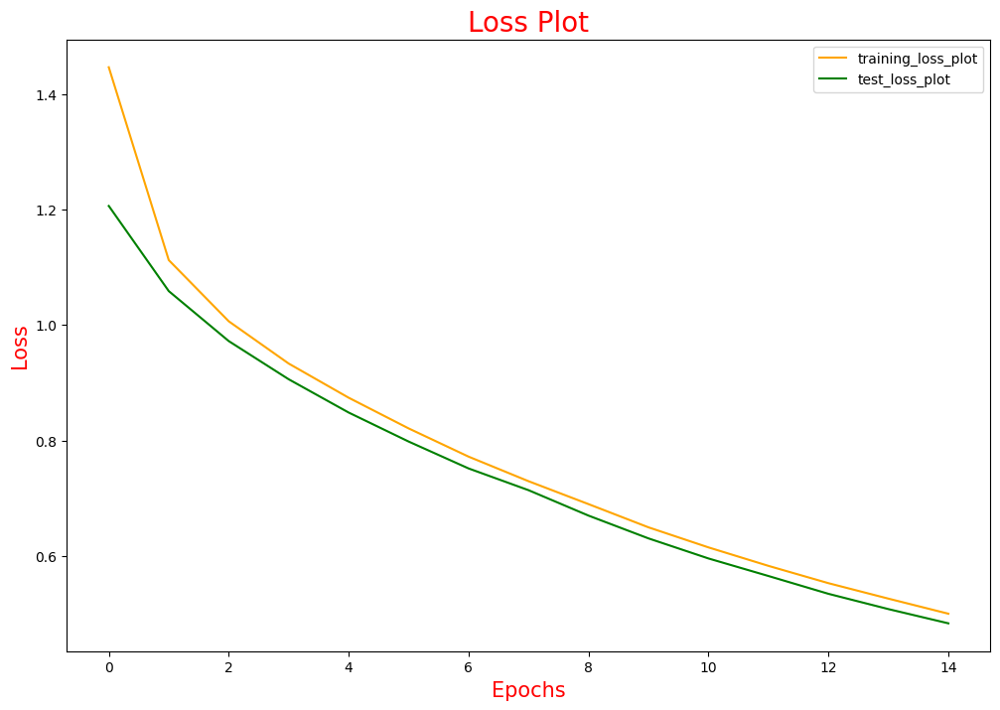

In [74]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()


In [71]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) 
    img_tensor_val = image_features_extract_model(temp_input) 
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val) 

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) 

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() 

        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions


In [72]:
def plot_attention_map (caption, weights, image) :

  fig = plt.figure(figsize = (10, 10))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(cap_len) :
    weights_img = np.reshape(weights[cap], (8,8))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 14, color = 'red')

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gist_heat', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [75]:
!pip install nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 792.7/792.7 kB 36.2 MB/s eta 0:00:00


In [76]:
from nltk.translate.bleu_score import sentence_bleu

In [77]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [78]:
image_test = path_test.copy()

In [231]:
def pred_caption(random, autoplay=False, weights=(0.5, 0.5, 0, 0)) :

    cap_test_data = caption_test.copy()
    rid = np.random.randint(0, random)
    test_image = image_test[rid]

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
    result, attention_plot, pred_test = evaluate(test_image)


    real_caption=filt_text(real_caption)      


    pred_caption=' '.join(result).rsplit(' ', 1)[0]


    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights=weights)
    print(f"BELU score: {score*100}")
    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)
    plot_attention_map(result, attention_plot, test_image)


    return test_image
    


BELU score: 54.88116360940264
Real Caption: white dog opens its mouth near smaller dog
Prediction Caption: white dog opens its mouth


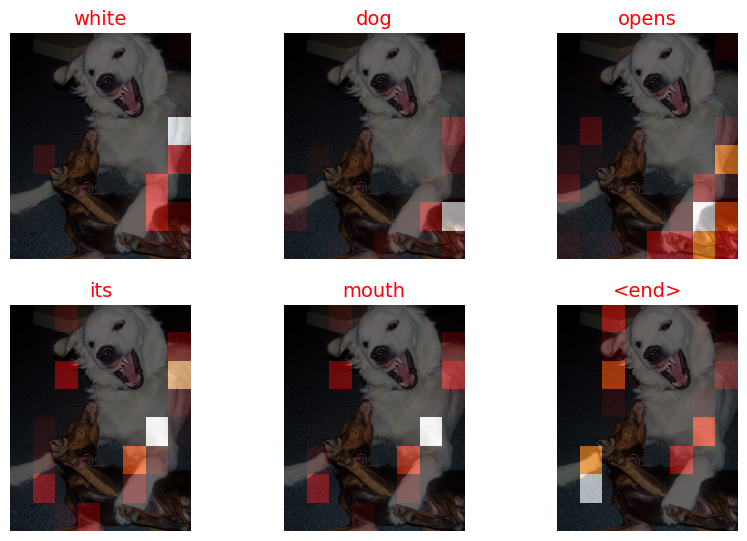

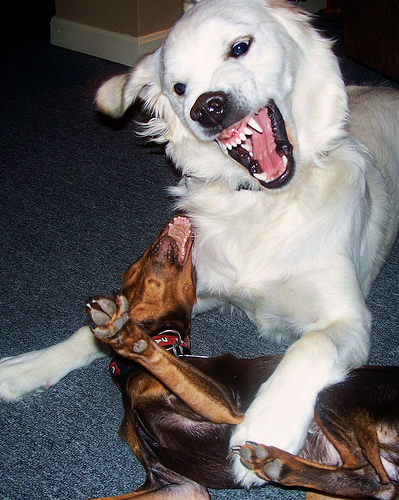

In [241]:
test_image = pred_caption(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 48.730396897437764
Real Caption: two women crouch near small child at medieval fair
Prediction Caption: two women crouch near medieval clothing


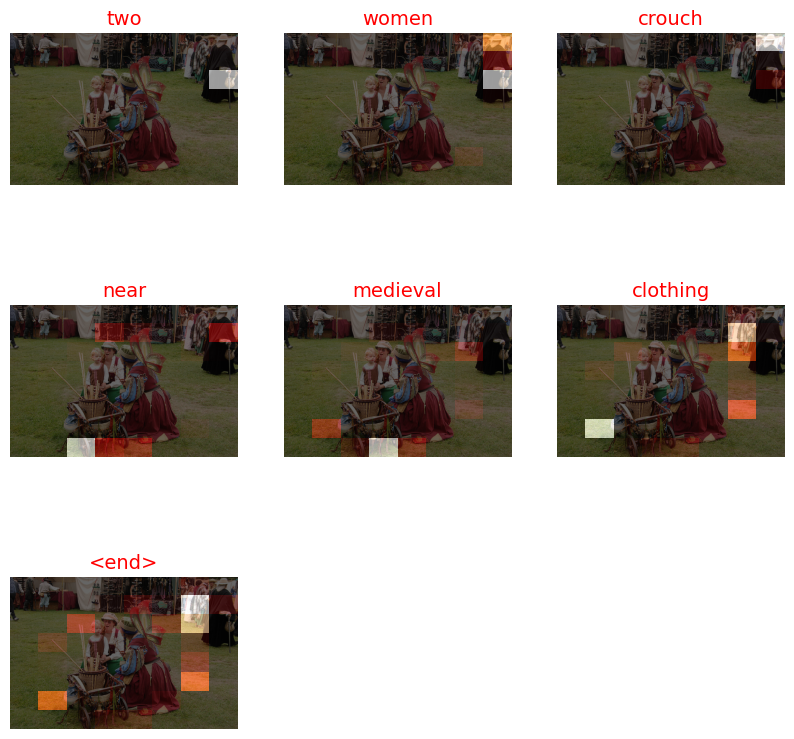

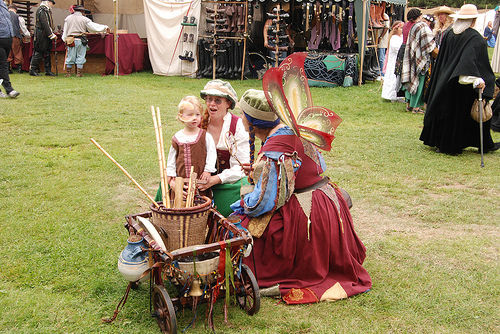

In [246]:
test_image = pred_caption(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 65.14390575310556
Real Caption: two dogs run along the green grass near the water
Prediction Caption: two dogs run along the green grass


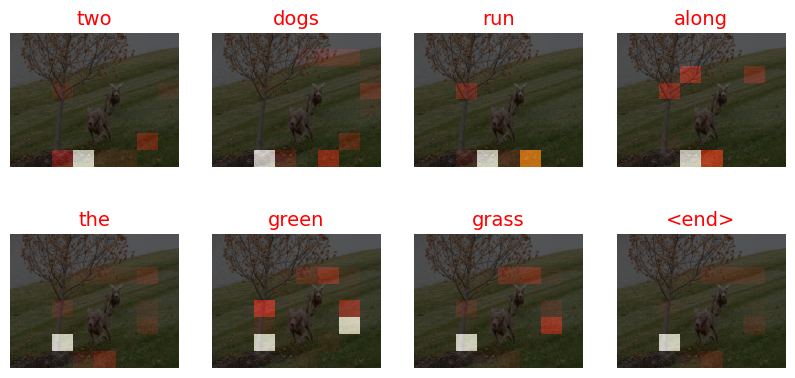

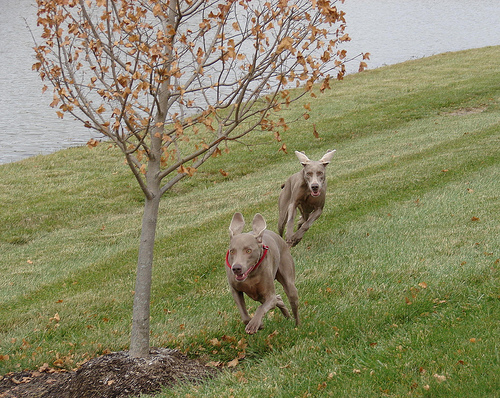

In [249]:
test_image = pred_caption(len(image_test), True, weights = (0.5, 0.25, 0, 0))
Image.open(test_image)

BELU score: 48.954165955695316
Real Caption: man wearing red jacket sitting on bench next to various camping items
Prediction Caption: man wearing red jacket sitting on bench


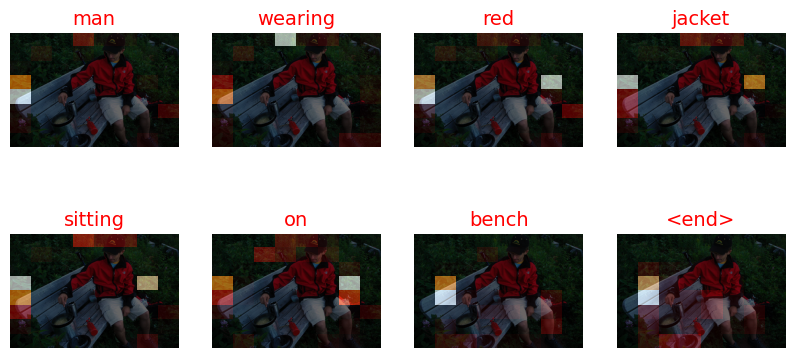

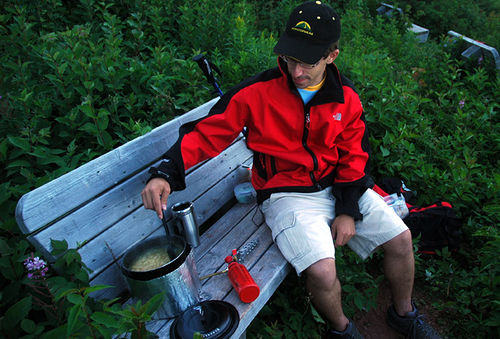

In [258]:
test_image = pred_caption(len(image_test), True, weights = (0.35, 0.25, 0, 0))
Image.open(test_image)

BELU score: 63.245553203367585
Real Caption: many birds sit on ledge
Prediction Caption: group of birds sit on ledge


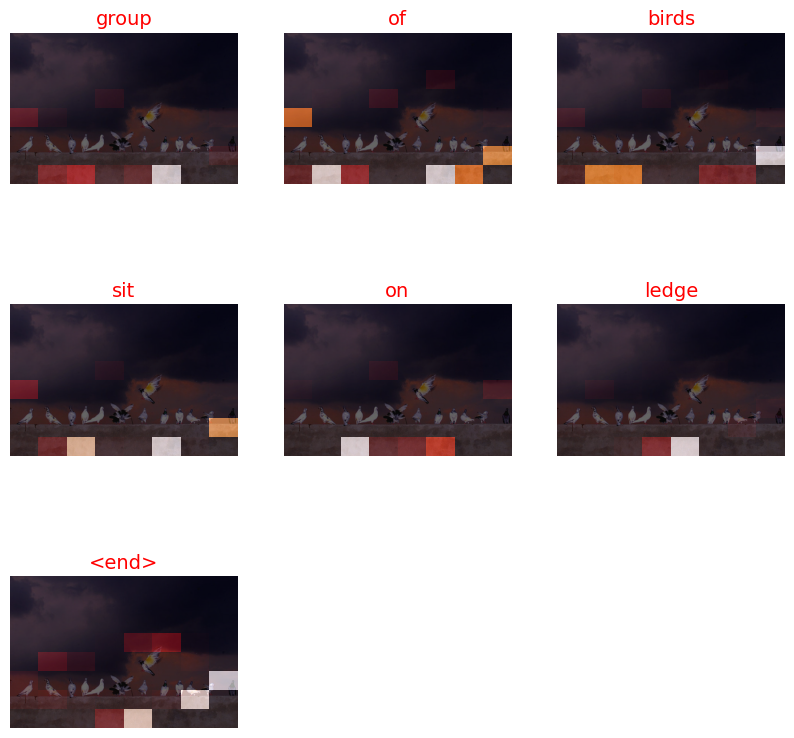

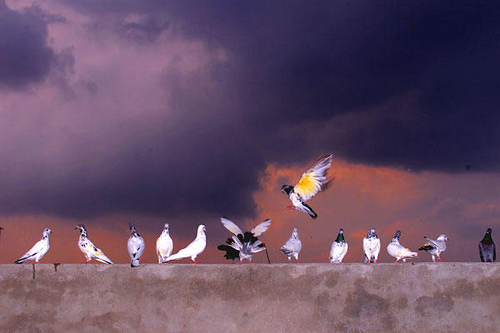

In [262]:
test_image = pred_caption(len(image_test), True, weights = (0.5, 0.5, 0, 0))
Image.open(test_image)

BELU score: 65.14390575310556
Real Caption: brown dog is running in the water by the beach
Prediction Caption: brown dog is running in the water


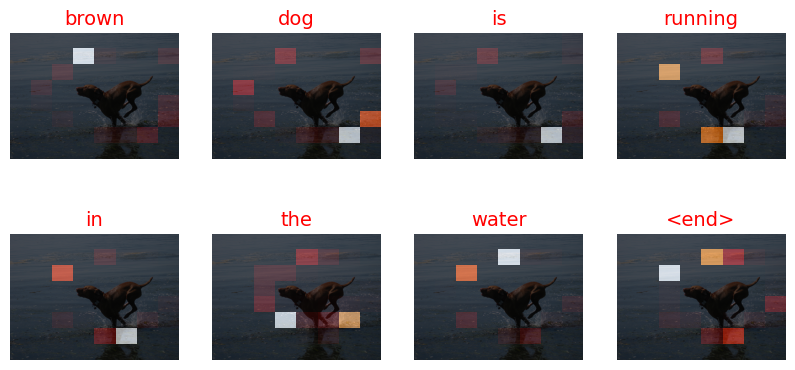

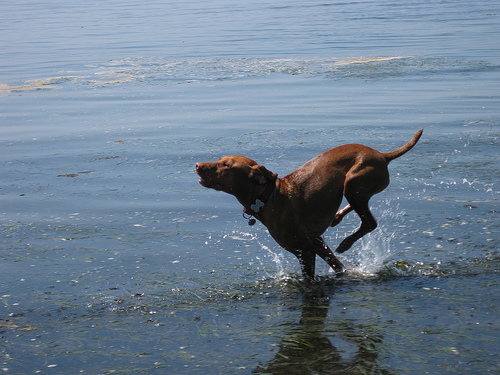

In [263]:
test_image = pred_caption(len(image_test), True, weights = (0.25, 0.5, 0, 0))
Image.open(test_image)

BELU score: 59.83000783002185
Real Caption: snowboarder slides down the side of an UNK house buried in snow
Prediction Caption: snowboarder slides down the side of snow covered mountain


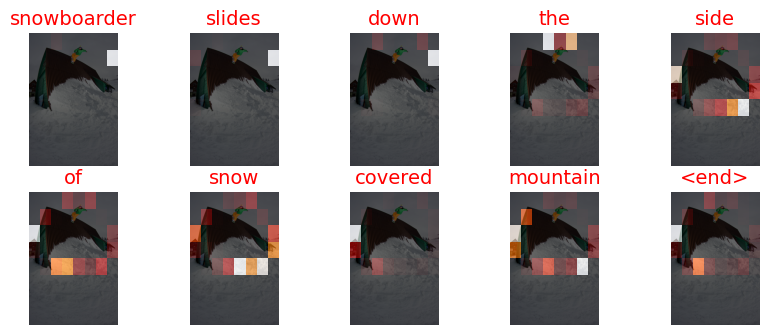

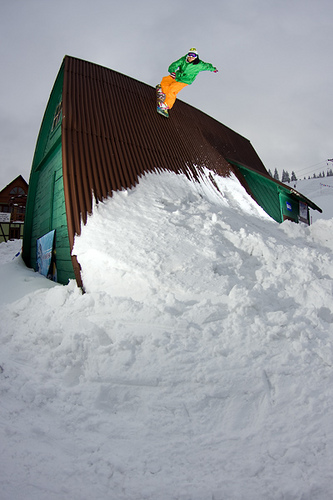

In [268]:
test_image = pred_caption(len(image_test), True, weights = (0.25, 0.25, 0, 0))
Image.open(test_image)

BELU score: 55.04959249310236
Real Caption: man wearing backpack and helmet riding bicycle
Prediction Caption: woman wearing backpack and helmet and cycling gear


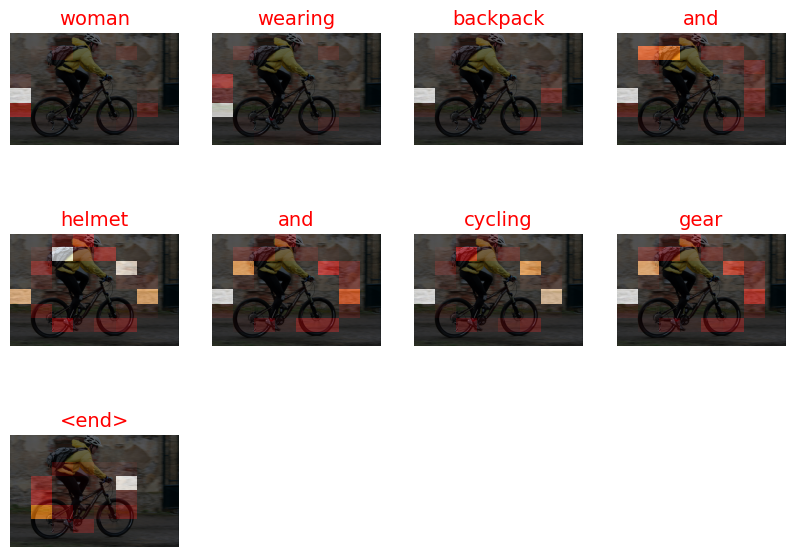

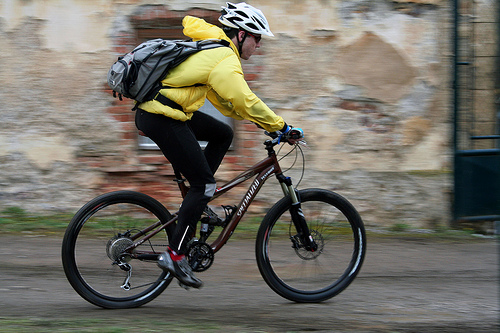

In [280]:
test_image = pred_caption(len(image_test), True, weights = (0.25, 0.5, 0, 0))
Image.open(test_image)